# import packages and load data

In [ ]:
# torch and torchvision imports
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import math
import glob

import os
from PIL import Image
from numpy import asarray
from skimage.color import lab2rgb, rgb2lab, rgb2gray
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
import torch.nn.functional as F
import torchvision.transforms as T

import warnings
warnings.simplefilter("ignore", UserWarning)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')     
device

device(type='cuda')

In [ ]:
! wget https://github.com/lonperman/dataset-naturaleza/archive/refs/heads/main.zip
! unzip main.zip

# Image examples

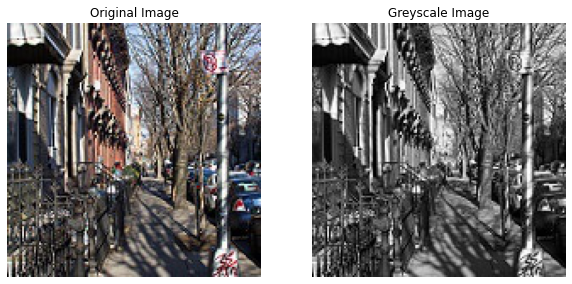

In [ ]:
img_sample = Image.open("/content/dataset-naturaleza-main/seg_train/seg_train/street/999.jpg")
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_sample,cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title("Original Image")
grey_image_sample = img_sample.convert('L')
plt.subplot(1, 2, 2)
plt.imshow(grey_image_sample,cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.title("Greyscale Image")
plt.show()

In [ ]:
import os
from PIL import Image
from numpy import asarray
from skimage.color import lab2rgb, rgb2lab, rgb2gray

directory_path = '/content/dataset-naturaleza-main/seg_train/seg_train'
directory_files = os.listdir(directory_path)

resize = 256

images = []
grey_scale_images = []
ab_images = []
other_shape_count = 0

for classname in directory_files:
  new_directory_path = directory_path+'/'+classname
  new_directory_files = os.listdir(new_directory_path)
  i=0
  print(classname)
  for image in new_directory_files:
    img = Image.open(new_directory_path+'/'+image)    
    cropped_image = transforms.Resize([resize, resize])(img)
    
    if asarray(cropped_image).shape == (resize, resize, 3):    
      # create image_ab
      img_lab = rgb2lab(cropped_image).astype("float32")
      img_lab = transforms.ToTensor()(img_lab)
      img_L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
      img_ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

      ab_images.append(img_ab)

      reshaped_image = asarray(cropped_image).reshape(3,resize,resize)
      images.append(reshaped_image)
      grey_scale_images.append(img_L)

      i+=1
      if i >= 1000:
        break
      
    else:
      other_shape_count += 1


mountain
forest
street
buildings
glacier
sea


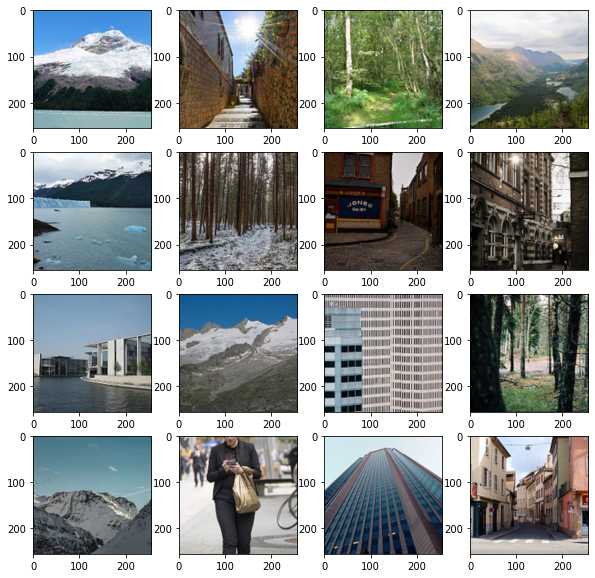

In [ ]:
import random 
# View some 16 random images
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
for i in range(4):
    for j in range(4):
        axes[i][j].imshow(images[random.randint(0,len(images))].reshape(resize,resize,3))
plt.show()

In [ ]:
len(images)

6000

# create dataset

torch.Size([32, 3, 256, 256])


<ipython-input-18-b6406cac428e>:15: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  dataset = CustomDataset(np.array(images), np.array(grey_scale_images), np.array(ab_images))


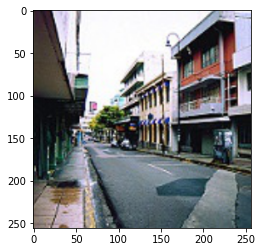

torch.Size([32, 1, 256, 256])


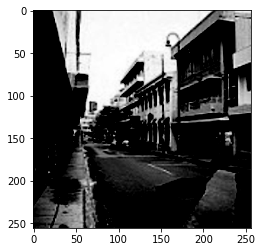

torch.Size([32, 2, 256, 256])


In [ ]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, array1, array2, array3):
        self.array1 = array1
        self.array2 = array2
        self.array3 = array3

    def __len__(self):
        return len(self.array1)

    def __getitem__(self, idx):
        return self.array1[idx], self.array2[idx], self.array3[idx]
        #return {'Original': self.array1[idx], 'L': self.array2[idx], 'ab': self.array3[idx]}

# Create the custom dataset
dataset = CustomDataset(np.array(images), np.array(grey_scale_images), np.array(ab_images))

# Create a DataLoader from the dataset
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)

# Check data size
for batch in dataloader:
    print(batch[0].shape)
    plt.imshow(batch[0][0].reshape(resize,resize,3))
    plt.show()
    print(batch[1].shape)
    plt.imshow(batch[1][0][0],cmap='gray', vmin=0, vmax=1)
    plt.show()
    print(batch[2].shape)
    break


# GAN model

In [ ]:
# Encoder and Decoder
def encoder(in_channels, out_channels, bn = True):
  layers = [nn.Conv2d(in_channels,out_channels, kernel_size=4,stride=2,padding=1)]
  if bn:
      layers.append(nn.BatchNorm2d(out_channels))
  layers.append(nn.LeakyReLU(0.2,True))
  return nn.Sequential(*layers)

def decoder(in_channels, out_channels, dropout = False):
  layers = [nn.ConvTranspose2d(in_channels,out_channels, kernel_size=4,stride=2,padding=1), nn.BatchNorm2d(out_channels)]
  if dropout:
      layers.append(nn.Dropout2d())
  return nn.Sequential(*layers)

In [ ]:
# Generator
class Generator(torch.nn.Module):
  def __init__(self):
    super(Generator, self).__init__()

    self.encoder1 = encoder(in_channels=1,   out_channels=64, bn = False)
    self.encoder2 = encoder(in_channels=64,  out_channels=128)
    self.encoder3 = encoder(in_channels=128, out_channels=256)
    self.encoder4 = encoder(in_channels=256, out_channels=512)
    self.encoder5 = encoder(in_channels=512, out_channels=512)
    self.encoder6 = encoder(in_channels=512, out_channels=512)
    self.encoder7 = encoder(in_channels=512, out_channels=512)

    self.conv1 = nn.Sequential(nn.Conv2d(in_channels=512,out_channels=512,kernel_size=3,stride=2,padding=1), nn.ReLU())

    self.decoder1 = decoder(in_channels=512, out_channels=512, dropout=True)
    self.decoder2 = decoder(in_channels=1024, out_channels=512, dropout=True)
    self.decoder3 = decoder(in_channels=1024, out_channels=512, dropout=True)
    self.decoder4 = decoder(in_channels=1024, out_channels=512)
    self.decoder5 = decoder(in_channels=1024, out_channels=256)
    self.decoder6 = decoder(in_channels=512, out_channels=128)
    self.decoder7 = decoder(in_channels=256, out_channels=64)

    self.conv2 = nn.Sequential(nn.ConvTranspose2d(in_channels = 128, out_channels = 2,kernel_size=4,stride=2,padding=1), nn.Tanh())

  def encode(self,x):
    x1 = self.encoder1(x)
    x2 = self.encoder2(x1)
    x3 = self.encoder3(x2)
    x4 = self.encoder4(x3)
    x5 = self.encoder5(x4)
    x6 = self.encoder6(x5)
    x7 = self.encoder7(x6)
    x8 = self.conv1(x7)
    skip_connection = [x1, x2, x3, x4, x5, x6, x7]

    return x8, skip_connection

  def decode(self, x, skip_connection): 
    x = torch.cat([F.relu(self.decoder1(x)),skip_connection[6]],1)
    x = F.relu(torch.cat([self.decoder2(x),skip_connection[5]],1))
    x = F.relu(torch.cat([self.decoder3(x),skip_connection[4]],1))
    x = F.relu(torch.cat([self.decoder4(x),skip_connection[3]],1))
    x = F.relu(torch.cat([self.decoder5(x),skip_connection[2]],1))
    x = F.relu(torch.cat([self.decoder6(x),skip_connection[1]],1))
    x = F.relu(torch.cat([self.decoder7(x),skip_connection[0]],1))

    return x

  def forward(self,x):
    x, skip_connection = self.encode(x)
    output = self.decode(x,skip_connection)
    return self.conv2(output)

In [ ]:
# Discriminator
class CNNBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, stride=2):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_channels,out_channels=out_channels, kernel_size=4, stride=stride, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )
    def forward(self, x):
        return self.conv(x)
        
class Discriminator(torch.nn.Module):
    def __init__(self, in_channels=3, dims=[64,128,256,512]):
        super().__init__()
        self.first = nn.Sequential(
            nn.Conv2d(3,dims[0], kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
        )

        layers = []
        in_channels = dims[0]
        for dim in dims[1:]:
            layers.append(CNNBlock(in_channels, dim, stride=1 if dim == dims[-1] else 2))
            in_channels = dim
        
        layers.append(nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1))        
        self.model = nn.Sequential(*layers)

    def forward(self, x, y):
        x = torch.cat([x,y], dim=1)
        x = self.first(x)
        return self.model(x)

In [ ]:
# Change Lab back to RGB
def lab_to_rgb(L, ab):
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

In [ ]:
# Training parameters
d = Discriminator(in_channels=3).to(device)
g = Generator().to(device)
opt_d = optim.Adam(d.parameters(), lr=2e-4, betas=(0.5, 0.999))
opt_g = optim.Adam(g.parameters(), lr=2e-4, betas=(0.5, 0.999))

BCE = nn.BCEWithLogitsLoss()
L1_loss = nn.L1Loss()
G_losses = []
D_losses = []

batch_size = 32
epochs = 20
L1_LAMBDA = 100
val_split = 0.1

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.7207643 G_loss 62.56972
D_loss:  0.6301813 G_loss 21.767897
D_loss:  0.52295226 G_loss 17.834442
D_loss:  0.44588855 G_loss 14.487643
D_loss:  0.2933207 G_loss 15.425453
D_loss:  0.58018076 G_loss 13.387945
D_loss:  0.3335498 G_loss 15.344268
D_loss:  0.18084708 G_loss 12.418566
D_loss:  0.6192825 G_loss 11.061066
D_loss:  0.16891608 G_loss 13.303025
D_loss:  0.3723277 G_loss 14.535919
D_loss:  0.19389227 G_loss 14.505355
D_loss:  0.2598584 G_loss 12.660242
D_loss:  0.50923395 G_loss 12.915272
D_loss:  0.19438712 G_loss 13.0542755
D_loss:  0.42467114 G_loss 12.283585
D_loss:  0.11735785 G_loss 12.895424
D_loss:  0.42602634 G_loss 12.57772
D_loss:  0.20819783 G_loss 12.645933
Epoch:  0 , Discriminator loss: tensor(0.1523, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(11.4951, device='cuda:0', grad_fn=<AddBackward0>)


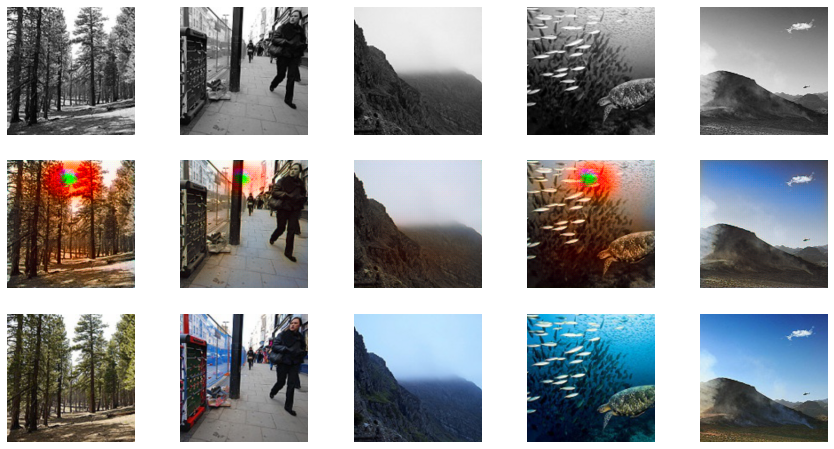

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.15879315 G_loss 13.369264
D_loss:  0.15171438 G_loss 13.365234
D_loss:  0.041241616 G_loss 13.235027
D_loss:  0.90958 G_loss 7.945752
D_loss:  0.44492453 G_loss 10.649116
D_loss:  0.33904123 G_loss 10.428325
D_loss:  0.15356243 G_loss 11.211299
D_loss:  0.124294415 G_loss 11.58765
D_loss:  0.08793759 G_loss 12.997775
D_loss:  0.1889023 G_loss 13.684225
D_loss:  0.46169788 G_loss 10.629744
D_loss:  0.15651155 G_loss 12.748516
D_loss:  0.05148807 G_loss 11.825264
D_loss:  0.21737117 G_loss 12.326707
D_loss:  0.11249052 G_loss 13.298185
D_loss:  0.047849804 G_loss 12.489437
D_loss:  0.033748146 G_loss 12.42059
D_loss:  0.021384837 G_loss 13.793327
D_loss:  0.044626553 G_loss 12.371323
Epoch:  1 , Discriminator loss: tensor(0.0259, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.2660, device='cuda:0', grad_fn=<AddBackward0>)


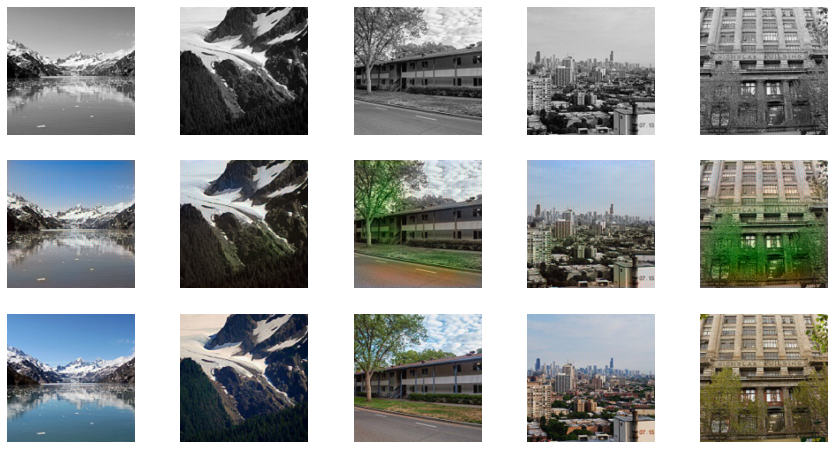

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.015135756 G_loss 14.628568
D_loss:  0.011151819 G_loss 13.6765175
D_loss:  0.741541 G_loss 11.465178
D_loss:  0.48803145 G_loss 9.607597
D_loss:  0.3353346 G_loss 10.598829
D_loss:  0.3636889 G_loss 11.509356
D_loss:  0.42165077 G_loss 10.4827175
D_loss:  0.5122409 G_loss 10.9665165
D_loss:  0.21688527 G_loss 9.872686
D_loss:  0.038933992 G_loss 12.459339
D_loss:  1.1658678 G_loss 12.2281475
D_loss:  0.16864932 G_loss 11.287217
D_loss:  0.059913523 G_loss 12.334355
D_loss:  0.039308105 G_loss 15.442676
D_loss:  0.0145146195 G_loss 12.635124
D_loss:  0.014391357 G_loss 12.901335
D_loss:  0.018584719 G_loss 12.83197
D_loss:  1.4013438 G_loss 11.7789955
D_loss:  0.12648584 G_loss 12.206295
Epoch:  2 , Discriminator loss: tensor(0.0208, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(13.2229, device='cuda:0', grad_fn=<AddBackward0>)


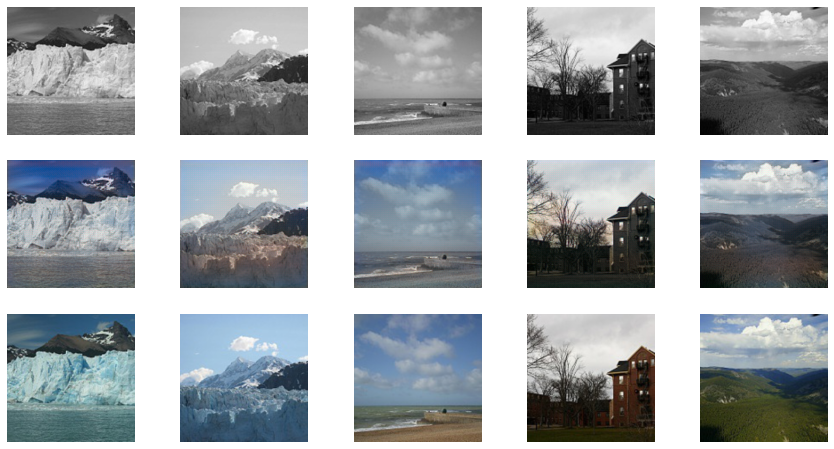

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.023274858 G_loss 12.882358
D_loss:  0.42435545 G_loss 12.305395
D_loss:  0.18560392 G_loss 11.963194
D_loss:  0.034585193 G_loss 11.61906
D_loss:  0.011682112 G_loss 12.729933
D_loss:  0.012821888 G_loss 13.633909
D_loss:  0.008642717 G_loss 12.534647
D_loss:  0.007207076 G_loss 12.220807
D_loss:  0.0086484775 G_loss 12.518777
D_loss:  0.017708223 G_loss 11.885242
D_loss:  0.006485196 G_loss 14.006447
D_loss:  0.032629747 G_loss 13.732753
D_loss:  0.007102203 G_loss 13.094315
D_loss:  0.006323265 G_loss 13.436756
D_loss:  0.005707263 G_loss 13.633448
D_loss:  0.037830893 G_loss 12.38032
D_loss:  0.0048991865 G_loss 13.985992
D_loss:  0.0042168666 G_loss 13.693358
D_loss:  0.0039248364 G_loss 13.964403
Epoch:  3 , Discriminator loss: tensor(0.0044, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(13.8527, device='cuda:0', grad_fn=<AddBackward0>)


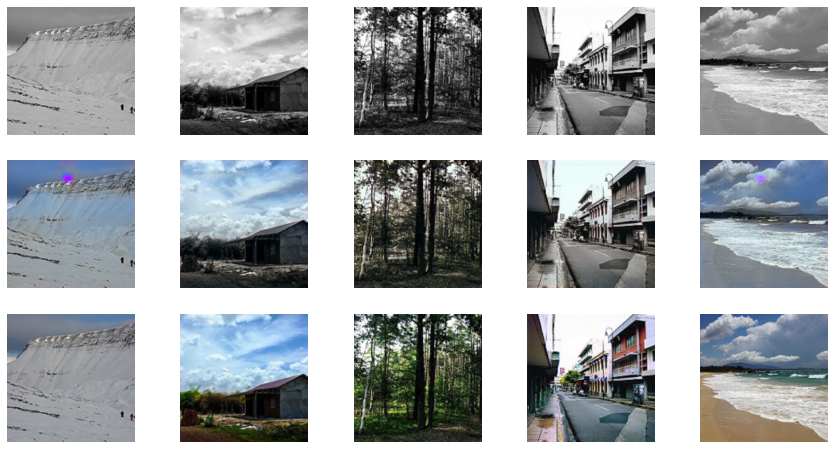

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0040118736 G_loss 14.027754
D_loss:  0.0091683585 G_loss 13.207686
D_loss:  0.008480061 G_loss 12.898287
D_loss:  0.0041870163 G_loss 14.472298
D_loss:  0.0057038763 G_loss 14.937441
D_loss:  0.0035835858 G_loss 13.968914
D_loss:  0.003995592 G_loss 14.367813
D_loss:  0.004056841 G_loss 13.421207
D_loss:  0.0050552245 G_loss 14.258364
D_loss:  0.0035127294 G_loss 14.39716
D_loss:  0.0033303115 G_loss 14.260468
D_loss:  0.0025288295 G_loss 15.938692
D_loss:  0.0035556848 G_loss 14.344337
D_loss:  0.0040806974 G_loss 15.937471
D_loss:  0.0041569904 G_loss 14.562666
D_loss:  0.0023048595 G_loss 14.911165
D_loss:  0.0028322283 G_loss 13.598867
D_loss:  0.0023938345 G_loss 13.532986
D_loss:  0.0017939885 G_loss 15.951066
Epoch:  4 , Discriminator loss: tensor(0.0026, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.0148, device='cuda:0', grad_fn=<AddBackward0>)


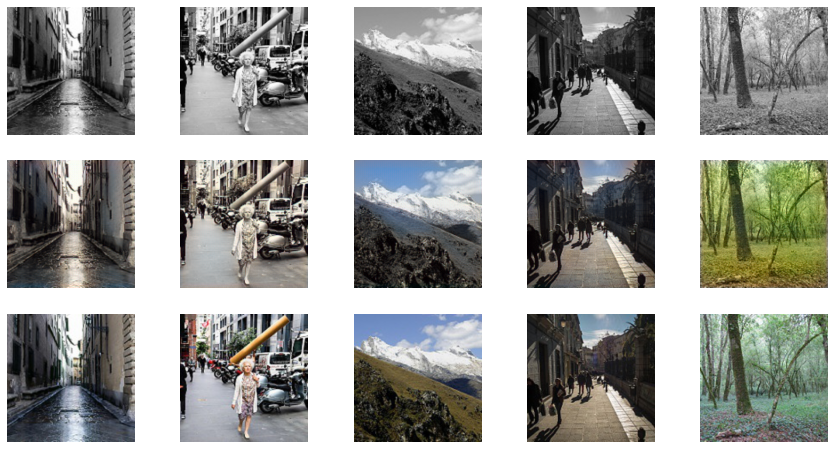

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.002438055 G_loss 14.811924
D_loss:  0.0020077564 G_loss 14.5580635
D_loss:  0.0048958343 G_loss 13.174371
D_loss:  0.0018626031 G_loss 15.471178
D_loss:  0.0017456416 G_loss 15.425774
D_loss:  0.0026452637 G_loss 12.7554
D_loss:  0.0016725375 G_loss 14.836758
D_loss:  0.0028163053 G_loss 13.928615
D_loss:  0.0019069205 G_loss 15.685667
D_loss:  0.002035374 G_loss 15.161156
D_loss:  0.0027338606 G_loss 13.940723
D_loss:  0.0021509714 G_loss 14.081153
D_loss:  0.0054739923 G_loss 12.858583
D_loss:  0.009413241 G_loss 15.576347
D_loss:  0.0014373625 G_loss 14.69211
D_loss:  0.0032597114 G_loss 13.971585
D_loss:  0.0016930569 G_loss 15.328944
D_loss:  0.0026188632 G_loss 17.431715
D_loss:  0.0028275398 G_loss 14.289257
Epoch:  5 , Discriminator loss: tensor(0.0013, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(18.9578, device='cuda:0', grad_fn=<AddBackward0>)


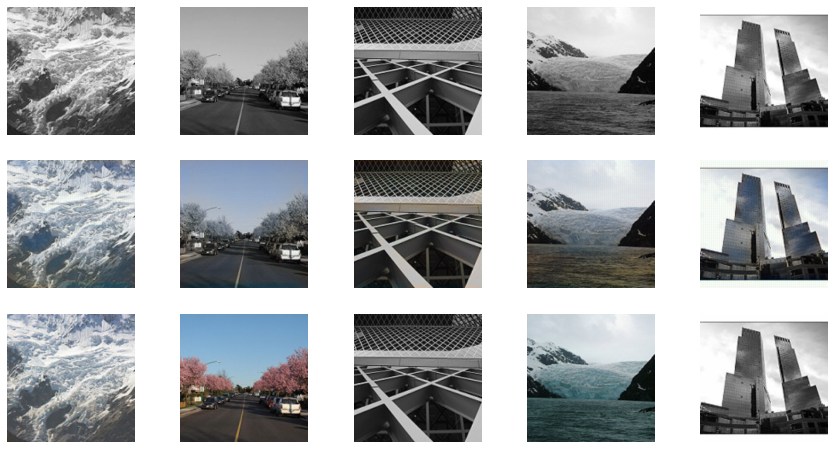

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0014060936 G_loss 16.704481
D_loss:  0.0011511635 G_loss 15.870922
D_loss:  0.0012309685 G_loss 16.901157
D_loss:  0.001216097 G_loss 15.182808
D_loss:  0.0018671672 G_loss 14.034601
D_loss:  0.0014753611 G_loss 15.741758
D_loss:  0.0012461352 G_loss 14.056881
D_loss:  0.0027293416 G_loss 13.900621
D_loss:  0.001534481 G_loss 17.459755
D_loss:  0.0013904294 G_loss 14.247066
D_loss:  0.0048942682 G_loss 13.413864
D_loss:  0.0013926981 G_loss 16.769733
D_loss:  0.0012823737 G_loss 14.778391
D_loss:  0.000965239 G_loss 16.612535
D_loss:  0.0010316847 G_loss 15.492806
D_loss:  0.0013182696 G_loss 13.928612
D_loss:  0.0010036946 G_loss 15.299929
D_loss:  0.0010393964 G_loss 16.356722
D_loss:  0.0014129542 G_loss 14.567871
Epoch:  6 , Discriminator loss: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(18.5205, device='cuda:0', grad_fn=<AddBackward0>)


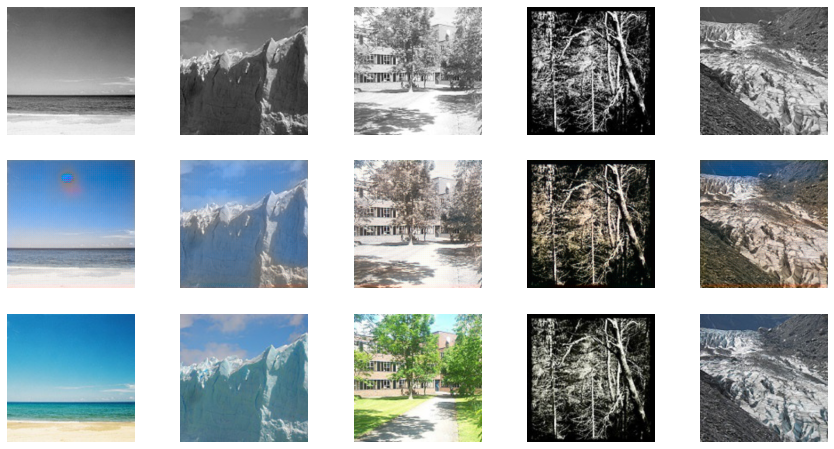

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0008176649 G_loss 16.191717
D_loss:  0.0024133255 G_loss 16.348083
D_loss:  0.004240264 G_loss 15.264061
D_loss:  1.8674097 G_loss 9.851639
D_loss:  0.67557967 G_loss 9.366926
D_loss:  0.6044135 G_loss 10.194952
D_loss:  0.36710113 G_loss 10.484592
D_loss:  0.41628492 G_loss 11.843225
D_loss:  0.28960937 G_loss 9.662319
D_loss:  0.25818616 G_loss 11.48997
D_loss:  0.10301879 G_loss 10.555366
D_loss:  0.23488843 G_loss 10.586225
D_loss:  0.086705945 G_loss 12.062143
D_loss:  0.016326342 G_loss 12.468578
D_loss:  0.029298907 G_loss 12.677265
D_loss:  0.008336669 G_loss 13.077408
D_loss:  0.009957852 G_loss 13.44819
D_loss:  0.009541151 G_loss 13.273085
D_loss:  0.0088010635 G_loss 13.306801
Epoch:  7 , Discriminator loss: tensor(0.0094, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(13.1880, device='cuda:0', grad_fn=<AddBackward0>)


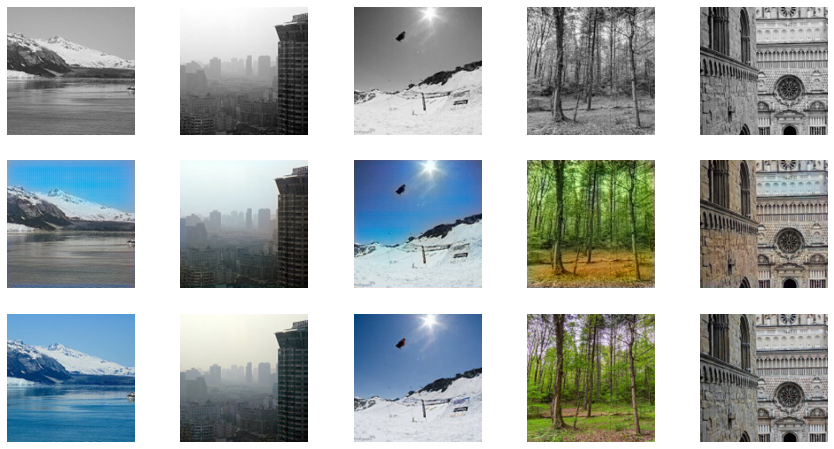

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.023175603 G_loss 11.657182
D_loss:  0.011053637 G_loss 12.970506
D_loss:  0.018313557 G_loss 12.722332
D_loss:  0.008636792 G_loss 15.844641
D_loss:  0.003905347 G_loss 15.2602625
D_loss:  0.00593898 G_loss 13.889225
D_loss:  0.0033044743 G_loss 14.853601
D_loss:  0.0045100735 G_loss 13.295931
D_loss:  0.0033691872 G_loss 13.342869
D_loss:  0.0032086312 G_loss 13.061277
D_loss:  0.0030928259 G_loss 13.355684
D_loss:  0.0027251171 G_loss 13.124893
D_loss:  0.002796361 G_loss 13.634754
D_loss:  0.0026880302 G_loss 13.589546
D_loss:  0.0033571154 G_loss 13.421249
D_loss:  0.0016486439 G_loss 14.381105
D_loss:  0.0016889202 G_loss 14.474814
D_loss:  0.0023937128 G_loss 14.150858
D_loss:  0.0022248065 G_loss 14.580812
Epoch:  8 , Discriminator loss: tensor(0.0033, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.4047, device='cuda:0', grad_fn=<AddBackward0>)


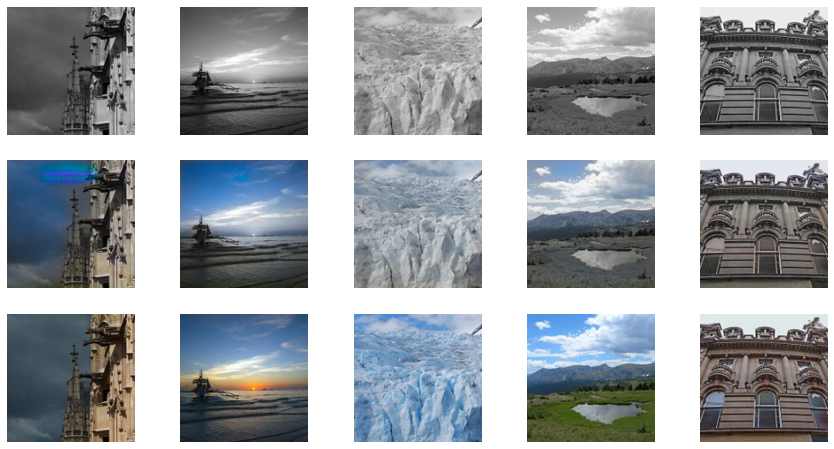

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0017941523 G_loss 15.14004
D_loss:  0.0050949273 G_loss 15.759778
D_loss:  0.0025376852 G_loss 16.363592
D_loss:  0.0022588894 G_loss 14.585094
D_loss:  0.0018461498 G_loss 15.217366
D_loss:  0.0014305229 G_loss 15.854125
D_loss:  0.0012370135 G_loss 14.918863
D_loss:  0.0013305163 G_loss 14.446513
D_loss:  0.0014457228 G_loss 14.776852
D_loss:  0.0015751729 G_loss 14.047815
D_loss:  0.0013330542 G_loss 14.845175
D_loss:  0.0015800982 G_loss 14.082808
D_loss:  0.001816828 G_loss 15.656077
D_loss:  0.0018249712 G_loss 15.496418
D_loss:  0.0015359278 G_loss 14.109902
D_loss:  0.0012176399 G_loss 15.139641
D_loss:  0.0011647863 G_loss 14.889939
D_loss:  0.0011350206 G_loss 14.816599
D_loss:  0.0017637613 G_loss 15.451811
Epoch:  9 , Discriminator loss: tensor(0.0095, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(22.0792, device='cuda:0', grad_fn=<AddBackward0>)


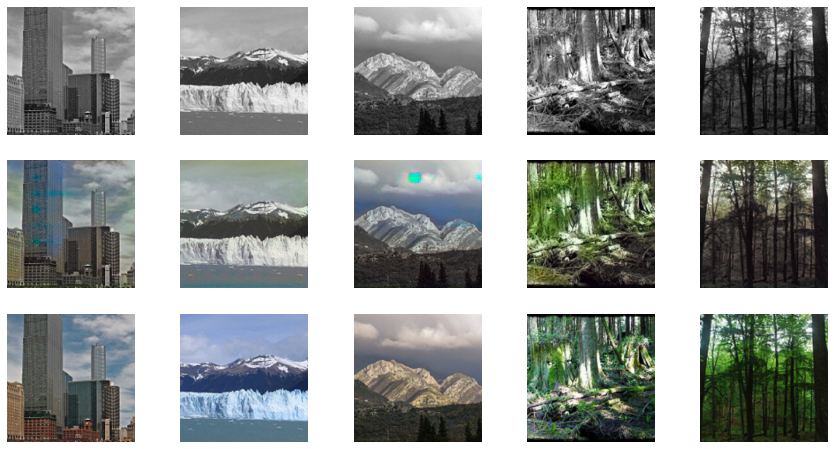

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0009174654 G_loss 17.634499
D_loss:  0.0023566808 G_loss 14.972389
D_loss:  0.0011518027 G_loss 15.446465
D_loss:  0.0037290002 G_loss 13.865892
D_loss:  0.002079618 G_loss 14.274067
D_loss:  0.0016450663 G_loss 15.67519
D_loss:  0.0028926064 G_loss 14.880312
D_loss:  0.0012778826 G_loss 16.503532
D_loss:  0.0010129218 G_loss 15.565193
D_loss:  0.012680608 G_loss 12.4360695
D_loss:  0.0010789625 G_loss 15.143093
D_loss:  0.0009504269 G_loss 15.607988
D_loss:  0.0011337362 G_loss 16.912277
D_loss:  0.0010638073 G_loss 15.287609
D_loss:  0.0010862646 G_loss 14.624977
D_loss:  0.0010663876 G_loss 14.347402
D_loss:  0.0016645779 G_loss 15.210405
D_loss:  0.0010340683 G_loss 14.770411
D_loss:  0.0012018654 G_loss 14.933771
Epoch:  10 , Discriminator loss: tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(16.1228, device='cuda:0', grad_fn=<AddBackward0>)


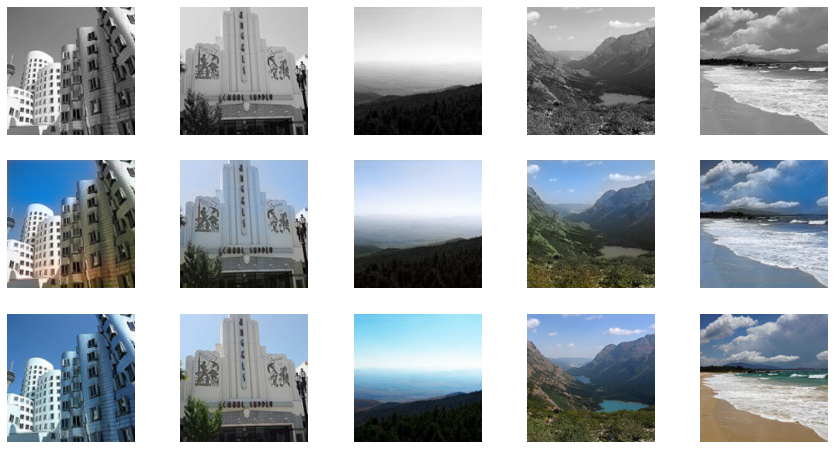

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0007357453 G_loss 15.442521
D_loss:  0.001543494 G_loss 14.665319
D_loss:  0.00517698 G_loss 13.277399
D_loss:  0.00096930313 G_loss 15.117205
D_loss:  0.0008323388 G_loss 14.795683
D_loss:  0.0009128755 G_loss 14.515255
D_loss:  0.0011064105 G_loss 14.358992
D_loss:  0.00077349134 G_loss 15.815386
D_loss:  0.0008194635 G_loss 17.237509
D_loss:  0.0012876294 G_loss 14.335653
D_loss:  0.0008050621 G_loss 15.864267
D_loss:  0.0007410655 G_loss 15.01049
D_loss:  0.0005518924 G_loss 16.23233
D_loss:  0.0006675535 G_loss 15.289895
D_loss:  0.0009311937 G_loss 15.694807
D_loss:  0.0005737521 G_loss 15.784777
D_loss:  0.00054527377 G_loss 15.991362
D_loss:  0.0026566826 G_loss 14.28927
D_loss:  0.00064447813 G_loss 15.563114
Epoch:  11 , Discriminator loss: tensor(0.0006, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(16.1605, device='cuda:0', grad_fn=<AddBackward0>)


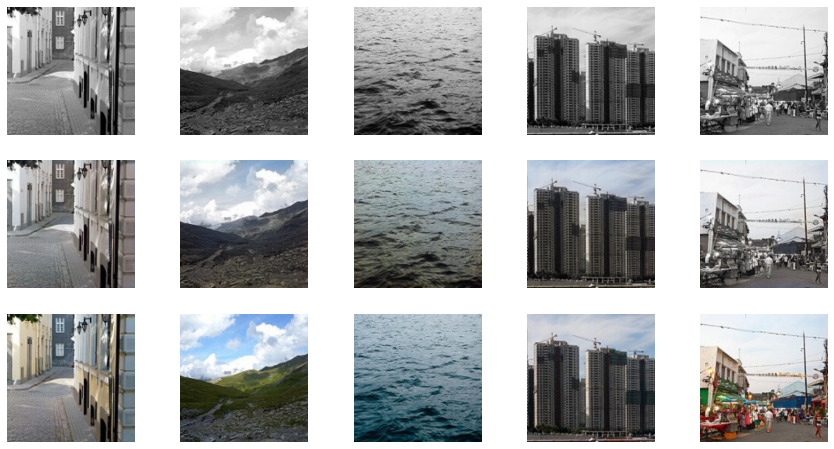

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0008972285 G_loss 14.838678
D_loss:  0.0005887929 G_loss 16.618484
D_loss:  0.000536196 G_loss 14.500242
D_loss:  0.0005161833 G_loss 14.578768
D_loss:  0.00047021254 G_loss 16.535498
D_loss:  0.00048454336 G_loss 17.384724
D_loss:  0.00045857564 G_loss 16.93332
D_loss:  0.00040552352 G_loss 15.711004
D_loss:  0.000477477 G_loss 15.735253
D_loss:  0.00041412778 G_loss 15.599519
D_loss:  0.00044287188 G_loss 15.350925
D_loss:  0.0004632259 G_loss 14.715042
D_loss:  0.0005730131 G_loss 15.061215
D_loss:  0.012836964 G_loss 14.737424
D_loss:  0.00046713834 G_loss 15.797724
D_loss:  0.00055410486 G_loss 16.072716
D_loss:  0.0004600564 G_loss 16.920319
D_loss:  0.00047208674 G_loss 15.922981
D_loss:  0.000695691 G_loss 15.216501
Epoch:  12 , Discriminator loss: tensor(0.0010, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.4473, device='cuda:0', grad_fn=<AddBackward0>)


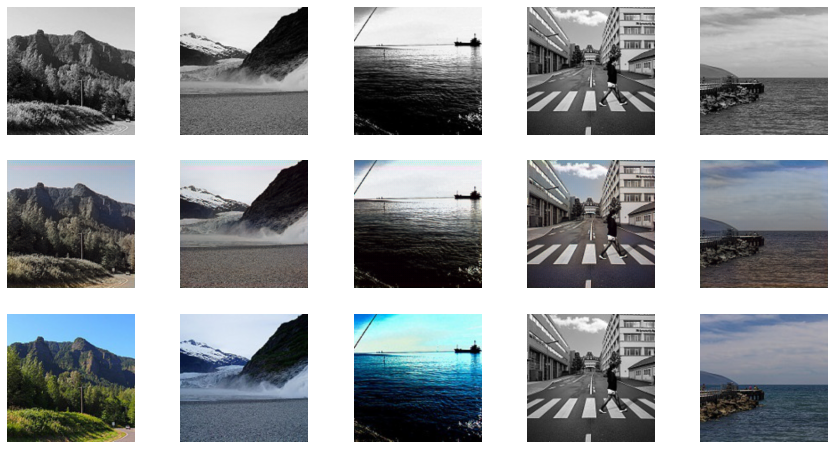

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0027928469 G_loss 14.083616
D_loss:  0.00058852416 G_loss 16.195745
D_loss:  0.007918245 G_loss 13.687598
D_loss:  0.6337277 G_loss 8.7199745
D_loss:  0.4805627 G_loss 7.721792
D_loss:  0.5576607 G_loss 10.14951
D_loss:  0.5628714 G_loss 7.525267
D_loss:  0.17178233 G_loss 11.009333
D_loss:  0.4455794 G_loss 9.455177
D_loss:  0.7121889 G_loss 8.280856
D_loss:  0.0660446 G_loss 10.685711
D_loss:  0.014782784 G_loss 13.964379
D_loss:  0.0075261416 G_loss 12.958969
D_loss:  0.01274188 G_loss 14.920141
D_loss:  0.0046945703 G_loss 14.069754
D_loss:  0.012025015 G_loss 13.39895
D_loss:  0.0054891417 G_loss 15.299503
D_loss:  0.0021087439 G_loss 15.003864
D_loss:  0.0023795052 G_loss 13.9193325
Epoch:  13 , Discriminator loss: tensor(0.0016, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.5645, device='cuda:0', grad_fn=<AddBackward0>)


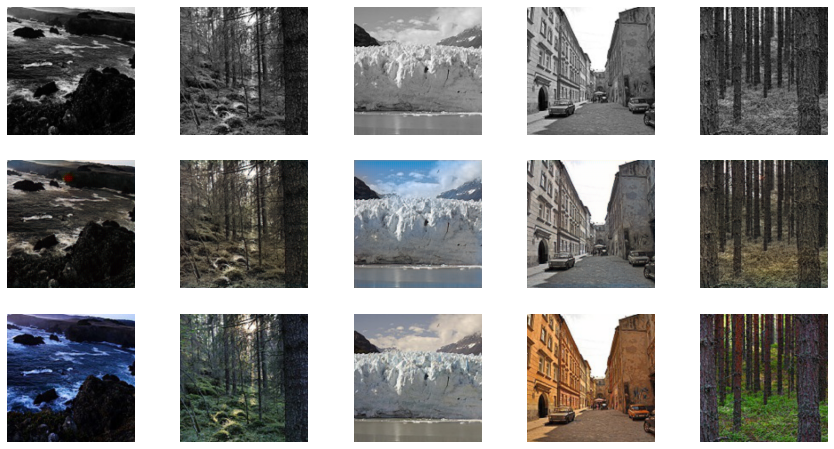

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.0019778304 G_loss 14.580156
D_loss:  0.0043445984 G_loss 12.722729
D_loss:  0.005206735 G_loss 14.199558
D_loss:  0.003504219 G_loss 14.460416
D_loss:  0.0047656484 G_loss 15.009556
D_loss:  0.0046878206 G_loss 13.819674
D_loss:  0.002490368 G_loss 15.906705
D_loss:  0.0029549585 G_loss 14.896357
D_loss:  0.012493571 G_loss 13.646864
D_loss:  0.010144243 G_loss 13.58891
D_loss:  0.07317304 G_loss 13.165193
D_loss:  1.1043688 G_loss 10.210305
D_loss:  0.65575165 G_loss 8.631005
D_loss:  0.4343673 G_loss 8.398993
D_loss:  0.5214175 G_loss 8.160669
D_loss:  0.46996772 G_loss 8.445606
D_loss:  0.48627594 G_loss 10.16671
D_loss:  0.60426444 G_loss 8.175207
D_loss:  0.74423873 G_loss 8.802523
Epoch:  14 , Discriminator loss: tensor(0.5170, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(9.7103, device='cuda:0', grad_fn=<AddBackward0>)


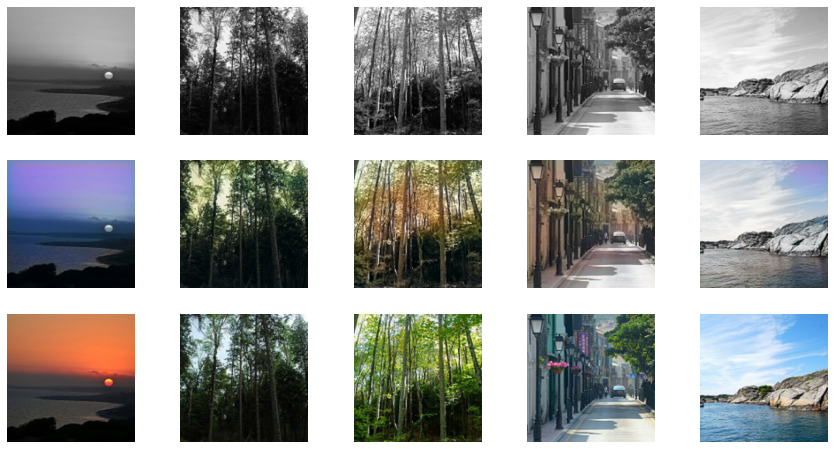

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.4379125 G_loss 9.785208
D_loss:  0.42974228 G_loss 8.806931
D_loss:  0.51405436 G_loss 9.194479
D_loss:  0.26590002 G_loss 10.103353
D_loss:  0.6626824 G_loss 9.204569
D_loss:  0.18028459 G_loss 11.064764
D_loss:  0.49377653 G_loss 9.507996
D_loss:  0.29063776 G_loss 9.387021
D_loss:  0.1975775 G_loss 19.158213
D_loss:  0.023080224 G_loss 12.43095
D_loss:  0.04807742 G_loss 12.304177
D_loss:  0.062424317 G_loss 12.545208
D_loss:  0.04090786 G_loss 13.121535
D_loss:  1.1649556 G_loss 7.4960966
D_loss:  0.6234001 G_loss 9.308574
D_loss:  0.68417835 G_loss 8.421091
D_loss:  0.5016357 G_loss 8.464471
D_loss:  0.2801576 G_loss 10.58513
D_loss:  0.45315623 G_loss 8.911461
Epoch:  15 , Discriminator loss: tensor(1.0632, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(7.4184, device='cuda:0', grad_fn=<AddBackward0>)


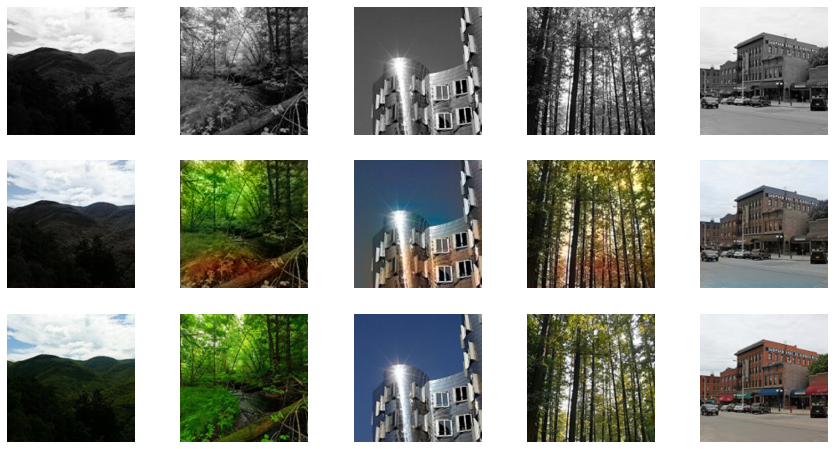

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.64670855 G_loss 9.156619
D_loss:  0.4122178 G_loss 8.586677
D_loss:  0.57421565 G_loss 8.05483
D_loss:  0.57316387 G_loss 8.369034
D_loss:  0.4322029 G_loss 10.029937
D_loss:  0.455356 G_loss 8.030175
D_loss:  0.5249065 G_loss 7.841886
D_loss:  0.32555643 G_loss 10.387608
D_loss:  0.7899955 G_loss 8.825651
D_loss:  0.47937745 G_loss 9.175868
D_loss:  0.36722028 G_loss 9.342852
D_loss:  0.377046 G_loss 9.694827
D_loss:  0.12881057 G_loss 10.84993
D_loss:  0.20008549 G_loss 11.1753435
D_loss:  0.4035288 G_loss 9.443162
D_loss:  0.35137954 G_loss 10.227587
D_loss:  0.09349664 G_loss 11.293453
D_loss:  0.11243379 G_loss 10.938002
D_loss:  0.04547502 G_loss 12.417347
Epoch:  16 , Discriminator loss: tensor(0.0358, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(12.6427, device='cuda:0', grad_fn=<AddBackward0>)


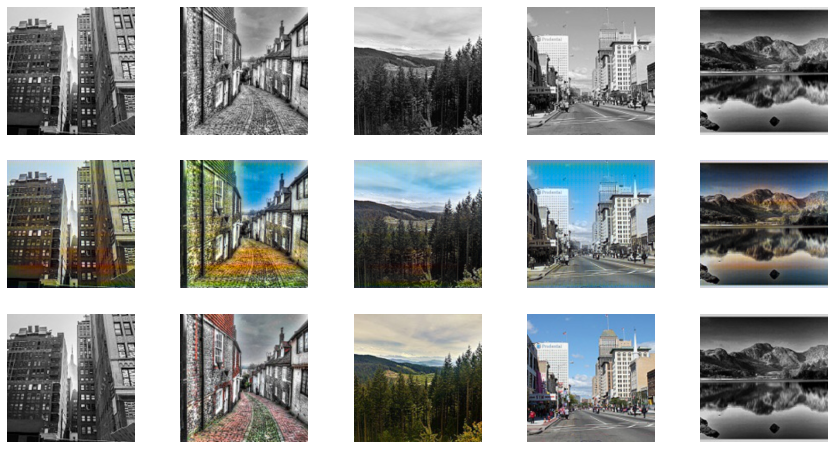

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.011357786 G_loss 12.988935
D_loss:  0.45016232 G_loss 12.23875
D_loss:  0.056675382 G_loss 12.175381
D_loss:  0.11936936 G_loss 10.9963455
D_loss:  0.017068673 G_loss 13.651453
D_loss:  0.019174818 G_loss 13.741701
D_loss:  0.012207986 G_loss 14.218088
D_loss:  0.014807096 G_loss 13.962613
D_loss:  0.044385962 G_loss 14.43354
D_loss:  0.023467558 G_loss 15.225077
D_loss:  0.11743046 G_loss 11.176802
D_loss:  0.032505497 G_loss 11.825097
D_loss:  0.015564412 G_loss 16.963211
D_loss:  0.07842812 G_loss 12.207309
D_loss:  0.08027615 G_loss 12.3414135
D_loss:  0.017094128 G_loss 13.019352
D_loss:  0.015078797 G_loss 12.681267
D_loss:  0.01909528 G_loss 12.334087
D_loss:  0.008594865 G_loss 14.368304
Epoch:  17 , Discriminator loss: tensor(0.0080, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(14.7511, device='cuda:0', grad_fn=<AddBackward0>)


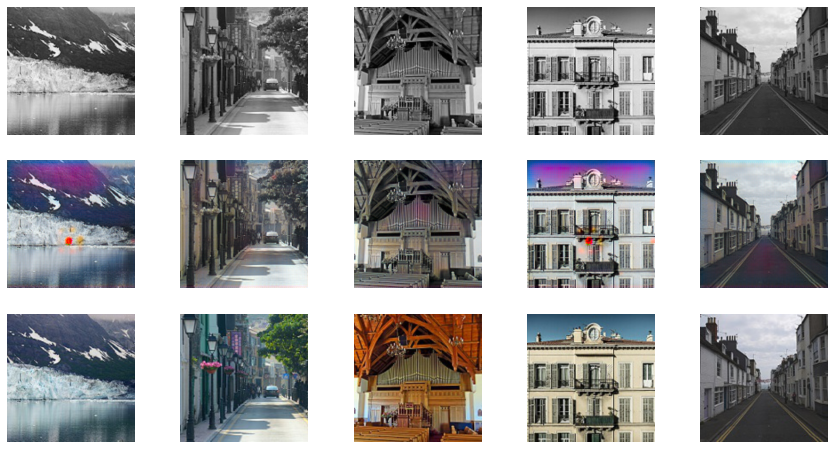

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.015091872 G_loss 13.0904
D_loss:  0.00813776 G_loss 13.54107
D_loss:  0.9830142 G_loss 14.043546
D_loss:  0.024155403 G_loss 11.602132
D_loss:  0.014553747 G_loss 12.992776
D_loss:  0.013048722 G_loss 13.424585
D_loss:  0.025463076 G_loss 12.625511
D_loss:  0.0068030525 G_loss 14.299814
D_loss:  0.005864983 G_loss 16.968292
D_loss:  0.008462014 G_loss 14.087474
D_loss:  0.0027357815 G_loss 16.72019
D_loss:  0.0022139978 G_loss 14.818796
D_loss:  0.003954974 G_loss 17.002094
D_loss:  0.0035311356 G_loss 17.616032
D_loss:  0.001780129 G_loss 15.73353
D_loss:  0.016268887 G_loss 13.639406
D_loss:  0.004453972 G_loss 14.888628
D_loss:  0.03469525 G_loss 17.454744
D_loss:  1.5082111 G_loss 10.990789
Epoch:  18 , Discriminator loss: tensor(0.0316, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(11.0450, device='cuda:0', grad_fn=<AddBackward0>)


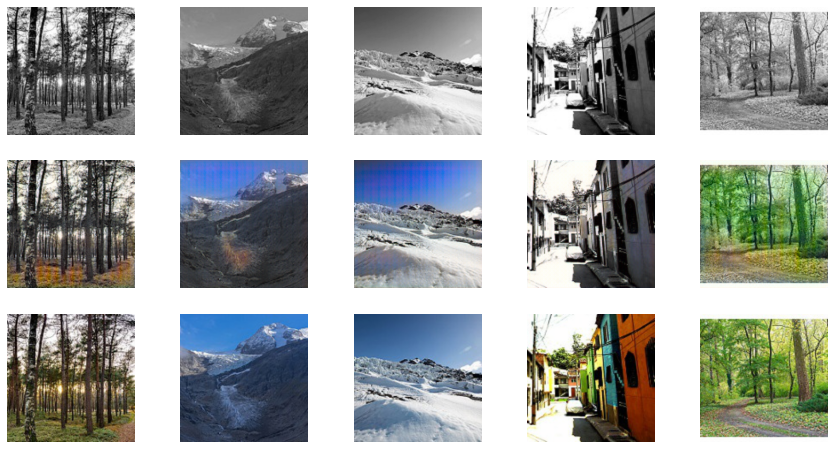

  0%|          | 0/188 [00:00<?, ?it/s]

D_loss:  0.07740195 G_loss 12.514388
D_loss:  0.021330345 G_loss 11.275205
D_loss:  0.008216616 G_loss 13.471436
D_loss:  0.008551841 G_loss 14.458984
D_loss:  0.111125164 G_loss 10.049122
D_loss:  0.027846156 G_loss 12.811229
D_loss:  0.36231464 G_loss 10.770515
D_loss:  0.5581352 G_loss 10.162014
D_loss:  0.6942302 G_loss 11.662374
D_loss:  0.18401994 G_loss 14.294189
D_loss:  0.032155722 G_loss 12.519043
D_loss:  0.27668217 G_loss 9.6414795
D_loss:  0.024452144 G_loss 23.188108
D_loss:  0.013673775 G_loss 14.14695
D_loss:  0.015871882 G_loss 13.540834
D_loss:  0.31826165 G_loss 12.193121
D_loss:  0.03982006 G_loss 13.025879
D_loss:  0.007341021 G_loss 12.821173
D_loss:  0.011689709 G_loss 11.875181
Epoch:  19 , Discriminator loss: tensor(0.0639, device='cuda:0', grad_fn=<DivBackward0>) Generator loss: tensor(11.4472, device='cuda:0', grad_fn=<AddBackward0>)


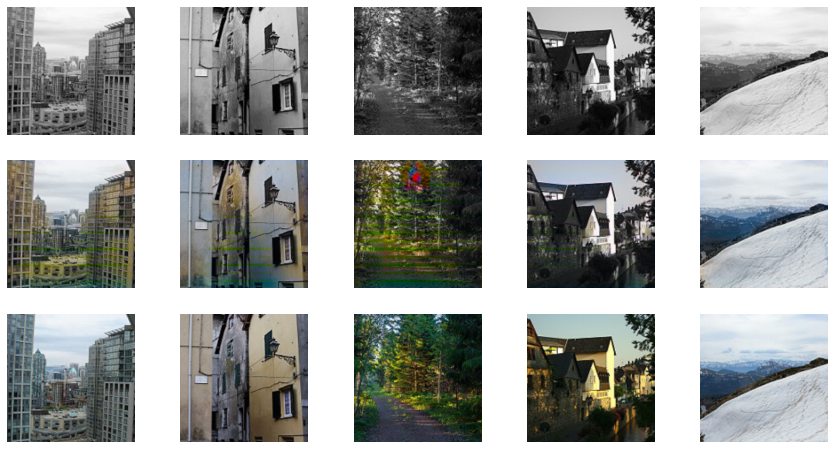

In [ ]:
# Training Step
for epoch in range(epochs):
    loop = tqdm(dataloader, leave=True)

    for idx, (o, l, ab) in enumerate(loop):
        #print(o.shape, l.shape, ab.shape)
        l, ab = l.to(device), ab.to(device)

        #Discriminator train       
        ab_fake = g(l)
        D_real = d(l, ab)
        D_fake = d(l, ab_fake.detach())

        D_real_l = BCE(D_real, torch.ones_like(D_real))
        D_fake_l = BCE(D_fake, torch.zeros_like(D_fake))
        D_loss = (D_real_l + D_fake_l) / 2
        opt_d.zero_grad()
        D_loss.backward()
        opt_d.step()

        #Generator train
        D_fake = d(l, ab_fake)
        G_fake_l = BCE(D_fake, torch.ones_like(D_fake))
        L1 = L1_loss(ab_fake, ab) * L1_LAMBDA
        G_loss = G_fake_l + L1
        
        opt_g.zero_grad()
        G_loss.backward()
        opt_g.step()

        if idx % 10 == 0:
          print("D_loss: ", D_loss.cpu().detach().numpy(), "G_loss", G_loss.cpu().detach().numpy())

    print("Epoch: ", epoch,  ", Discriminator loss:", D_loss, "Generator loss:", G_loss)
    D_losses.append(D_loss)
    G_losses.append(G_loss)
    o_, l_, ab_ = next(iter(val_dataloader))
    l_, ab_ = l_.to(device), ab_.to(device)
    g.eval()
    with torch.no_grad():
        fake_color = g(l_).detach()
        real_color = ab_
        L = l_
        fake_imgs = lab_to_rgb(L, fake_color)
        real_imgs = lab_to_rgb(L, real_color)
        fig = plt.figure(figsize=(15, 8))
        for i in range(5):
            ax = plt.subplot(3, 5, i + 1)
            ax.imshow(L[i][0].cpu(), cmap='gray')
            ax.axis("off")
            ax = plt.subplot(3, 5, i + 6)
            ax.imshow(fake_imgs[i])
            ax.axis("off")
            ax = plt.subplot(3, 5, i + 11)
            ax.imshow(real_imgs[i])
            ax.axis("off")
        plt.show()
    g.train()

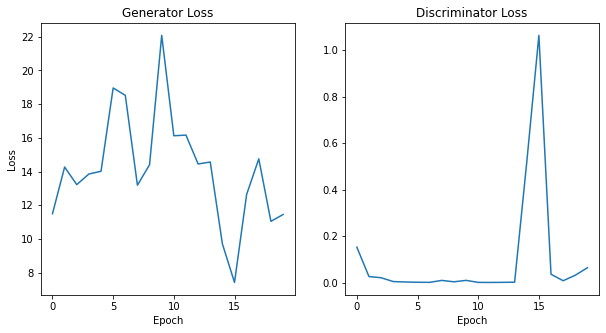

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot([x.cpu().detach().numpy() for x in G_losses])
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator Loss")
plt.subplot(1, 2, 2)
plt.plot([x.cpu().detach().numpy() for x in D_losses])
plt.xlabel("Epoch")
plt.title("Discriminator Loss")
plt.show()